### Physics 439
#### Final Project
#### Ben Howe
#### 5/10/2019

As usual, it is necessary to import various libraries to perform the task at hand.

In [1]:
import math
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.animation

Here we introduce the constant terms in our aparatus, create the empty arrays we will use and define the intial conditions.

In [2]:
# some constant values
a = 0.35 # radius of rim in meters
b = 1.1 # length of pendulum in meters
m = 0.7 # mass of bob in kg
alpha = 2.15 # angular speed of rim in rad/sec
g = 9.8 # acceleration due to gravity
N = 10000 # number of iterations
h = .001 # step size

In [3]:
# create some empty arrays
theta = np.zeros(N+1)
omega = np.zeros(N+1)
thetadot = np.zeros(N+1)
omegadot = np.zeros(N+1)
t = np.zeros(N+1)
x = np.zeros(N+1)
y = np.zeros(N+1)

In [4]:
# initial condition
theta[0] = np.pi/2.0

From the math (see part IV), we have two first order differential equations to define.

$ \ddot{\theta} = \frac{a\alpha^2}{b}\cos{\left(\theta-\alpha t \right )}-\frac{g}{b}\sin{\theta}$

In [5]:
# define some functions
def thetadot(omega):
    return omega
def omegadot(theta, t):
    return (a * alpha**2 / b) * np.cos(theta - alpha * t) - (g/b) * np.sin(theta)

To analyze the system, we use the 4th order Runge-Kutta method.

In [6]:
for i in range(N):
    k1_theta = h * thetadot(omega[i])
    k1_omega = h * omegadot(theta[i], t[i])
    
    k2_theta = h * thetadot(omega[i] + k1_omega/2.0)
    k2_omega = h * omegadot(theta[i] + k1_theta/2.0, t[i])
    
    k3_theta = h * thetadot(omega[i] + k2_omega/2.0)
    k3_omega = h * omegadot(theta[i] + k2_theta/2.0, t[i])
    
    k4_theta = h * thetadot(omega[i] + k3_omega)
    k4_omega = h * omegadot(theta[i] + k3_theta, t[i])
    
    theta[i+1] = theta[i] + (k1_theta + 2*k2_theta + 2*k3_theta + k4_theta)/6.0
    omega[i+1] = omega[i] + (k1_omega + 2*k2_omega + 2*k3_omega + k4_omega)/6.0
    t[i+1] = t[i] + h

First, we will plot the angle theta vs. time.

Text(0, 0.5, 'θ (rad)')

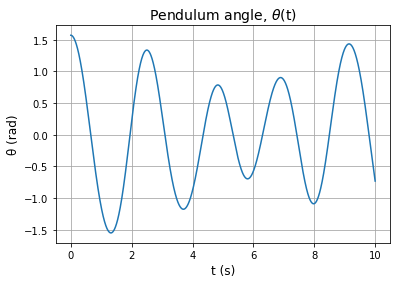

In [7]:
plt.plot(t,theta)
plt.grid(b=True, which='both', color='0.65', linestyle='-')
plt.title('Pendulum angle, $\u03b8$(t)', fontsize=14)
plt.xlabel('t (s)', fontsize=12)
plt.ylabel('\u03b8 (rad)', fontsize=12)

It is useful to switch back to Cartesian coordinates to visualize the motion of the system.

$x = a\cos{\left(\alpha t \right )} + b\sin{\theta}\\
y = a\sin{\left(\alpha t \right )} - b\cos{\theta}\\ $


In [8]:
# compute some x, y coordinates
def x_vec(theta, t):
    return a * np.cos(alpha * t) + b * np.sin(theta)
def y_vec(theta, t):
    return a * np.sin(alpha * t) - b * np.cos(theta)

In [9]:
for i in range(N+1):
    x[i] = x_vec(theta[i], t[i])
    y[i] = y_vec(theta[i], t[i])

Text(0, 0.5, 'y(m)')

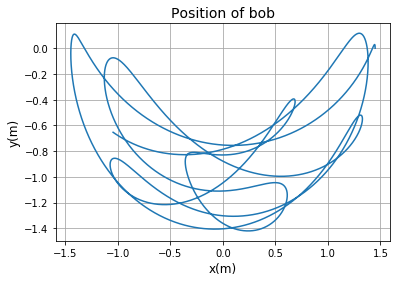

In [10]:
plt.plot(x,y)
plt.grid(b=True, which='both', color='0.65', linestyle='-')
plt.title('Position of bob', fontsize=14)
plt.xlabel('x(m)', fontsize=12)
plt.ylabel('y(m)', fontsize=12)

To enhance the presentation we now animate the motion of the pendulum bob.

In [11]:
# trim the data down for the animation
# 10000 points is too much to process
t_new = t[0::20]
x_new = x[0::20]
y_new = y[0::20]

In [12]:
# For best results with the animation, click the radio button for 'once'
# Press '+' three times to speed up the animation

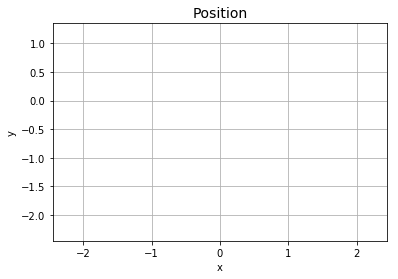

In [13]:
matplotlib.rcParams['animation.embed_limit'] = 2**128
# even with fewer values it is still necessary to increase the program's memory

fig, ax = plt.subplots()
ax.axis([-(a+b+1), (a+b+1), -(a+b+1), (a+1)])
plt.grid()
plt.title('Position', fontsize=14)
plt.xlabel('x')
plt.ylabel('y')
l, = ax.plot([],[])

def animate(i):
    l.set_data(x_new[:i], y_new[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t_new))

from IPython.display import HTML
HTML(ani.to_jshtml())

Credit for animation code:
https://stackoverflow.com/questions/43445103/inline-animations-in-jupyter